In [1]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random

In [2]:
def get_all_file_paths(directory):
  file_paths = []
  for root, _, files in os.walk(directory):
    for file in files:
      file_paths.append(os.path.join(root, file))
  return file_paths

In [3]:
# Example usage
dataset_folder = "Dataset"
all_files = get_all_file_paths(dataset_folder)

files = {'paths': [], 'group': [], 'class': [], 'filename': []}
# Print the list of file paths
for file_path in all_files:
    _, g, c, f = file_path.split("/")
    files['paths'].append(file_path)
    files['group'].append(g)
    files['class'].append(c)
    files['filename'].append(f)

df = pd.DataFrame(files)
df

,paths,group,class,filename
0,Dataset/train/diniz/diniz (101).jpg,train,diniz,diniz (101).jpg
1,Dataset/train/diniz/diniz (111).jpg,train,diniz,diniz (111).jpg
2,Dataset/train/diniz/diniz (35).jpg,train,diniz,diniz (35).jpg
3,Dataset/train/diniz/diniz (105).jpg,train,diniz,diniz (105).jpg
4,Dataset/train/diniz/diniz (164).jpg,train,diniz,diniz (164).jpg
...,...,...,...,...
1829,Dataset/valid/matheus/matheus37.jpg,valid,matheus,matheus37.jpg
1830,Dataset/valid/matheus/matheus9.jpg,valid,matheus,matheus9.jpg
1831,Dataset/valid/matheus/matheus33.jpg,valid,matheus,matheus33.jpg
1832,Dataset/valid/matheus/matheus43.jpg,valid,matheus,matheus43.jpg


In [4]:
def plot_group_imgs(images_path, images, hq, wq, figsize, color):
    if images_path is None and images is None:
        return None
    fig, axes = plt.subplots(hq, wq, figsize=(15, 9))
    i = 0
    for h in range(hq):
        for w in range(wq):
            if images is None:
                img = cv2.imread(images_path[i])
            else:
                img = images[i]
            img = cv2.cvtColor(img, color)
            axes[h, w].imshow(img)
            axes[h, w].set_title(images_path[i][8:], fontsize=10)
            i+=1
    plt.plot()

In [5]:
quant = 8
colunas = 4
linhas = 2
images = [df['paths'][i] for i in random.sample(range(1834), quant)]

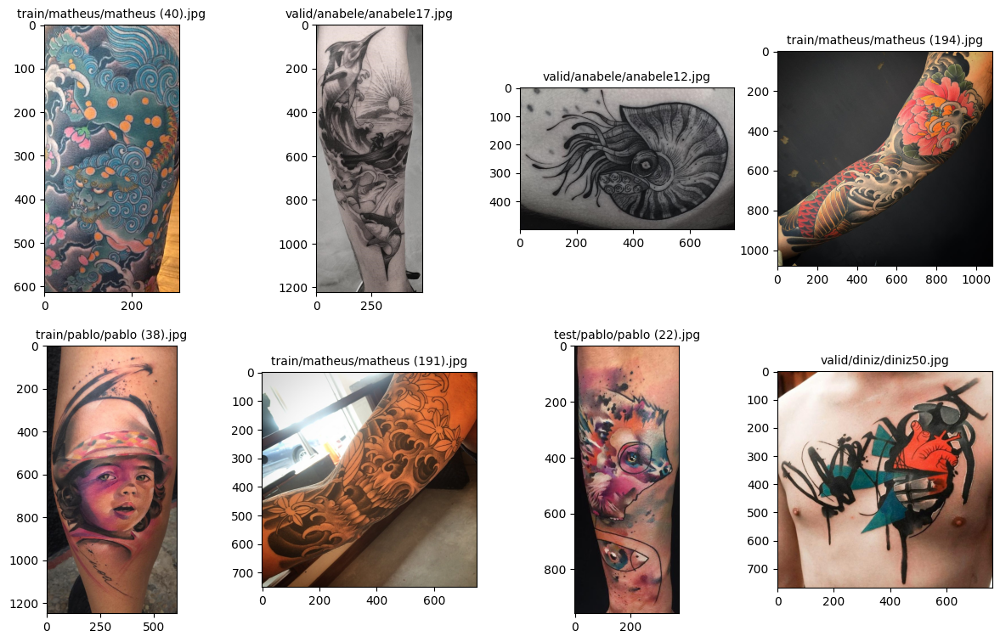

In [6]:
plot_group_imgs(images, None, linhas, colunas, (15, 9), cv2.COLOR_BGR2RGB)

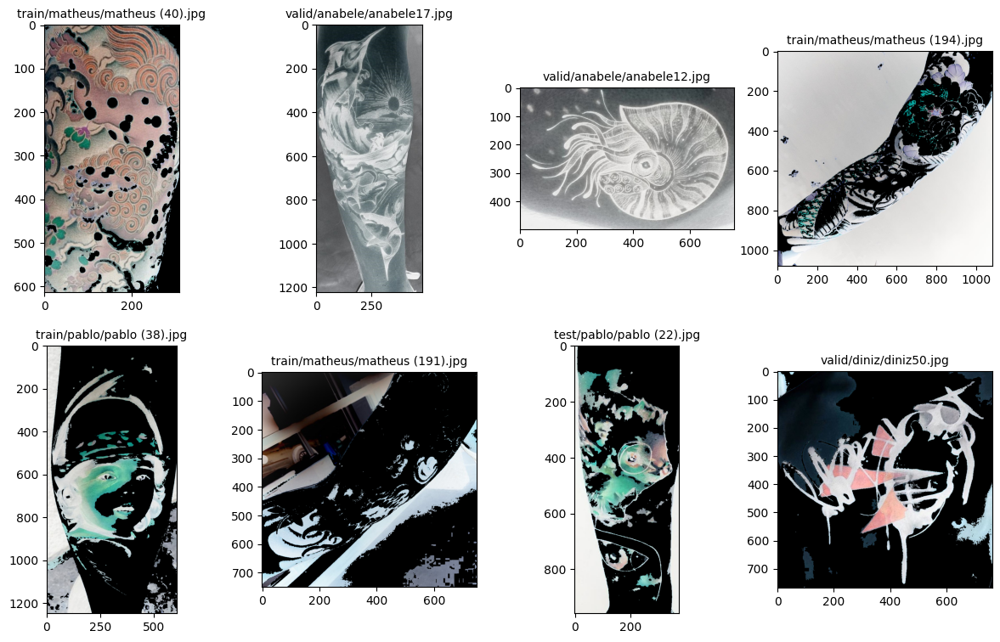

In [7]:
def skin_to_white(image):
    # Convert the image to HSV color space for easier skin tone detection
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define lower and upper bounds for skin color in HSV
    lower_skin = np.array([0, 48, 80], dtype="uint8")  # Adjust these values as needed
    upper_skin = np.array([20, 255, 255], dtype="uint8")  # Adjust these values as needed

    # Create a mask for skin color pixels
    skin_mask = cv2.inRange(hsv_image, lower_skin, upper_skin)

    # Apply the mask to the original image, setting skin pixels to white
    image[skin_mask > 0] = (255, 255, 255)
    image = 255 - image
    return image

modified_images = [skin_to_white(cv2.imread(i)) for i in images]
plot_group_imgs(images, modified_images, linhas, colunas, (15, 9), cv2.COLOR_BGR2RGB)

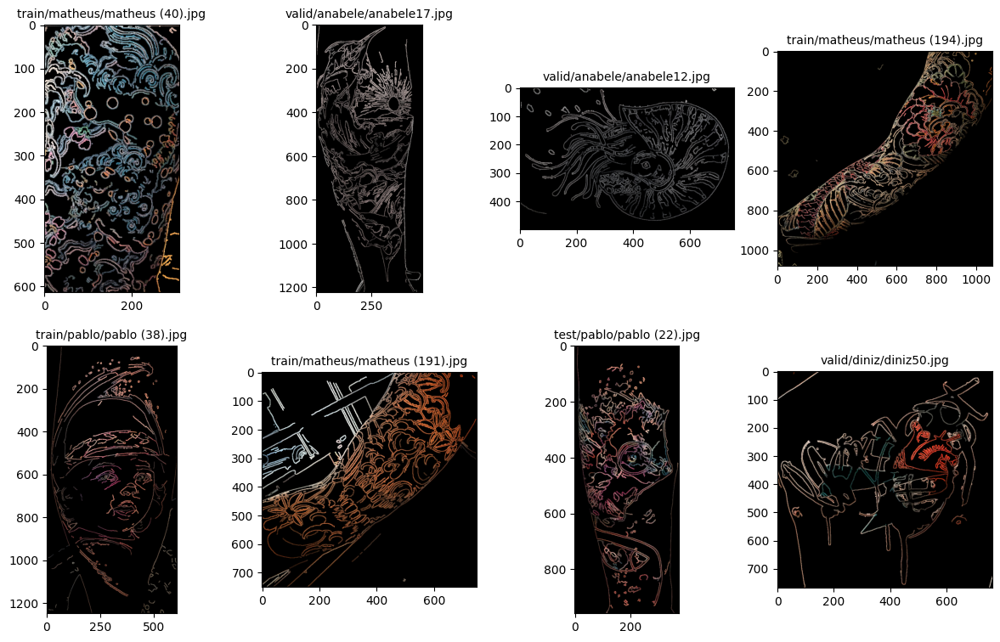

In [86]:
def realcar_tatuagem(imagem):
    # Conversão para escala de cinza
    imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
    
    imagem_suavizada = cv2.bilateralFilter(imagem_cinza, 9, 75, 75)
    bordas = cv2.Canny(imagem_suavizada, 30, 50)

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    bordas_dilatadas = cv2.dilate(bordas, kernel, iterations=1)

    mascara = cv2.threshold(bordas_dilatadas, 127, 255, cv2.THRESH_BINARY)[1]
    imagem_realcada = cv2.bitwise_and(imagem, imagem, mask=mascara)

    return imagem_realcada

realcadas = [realcar_tatuagem(cv2.imread(i)) for i in images]
plot_group_imgs(images, realcadas, linhas, colunas, (15, 9), cv2.COLOR_BGR2RGB)

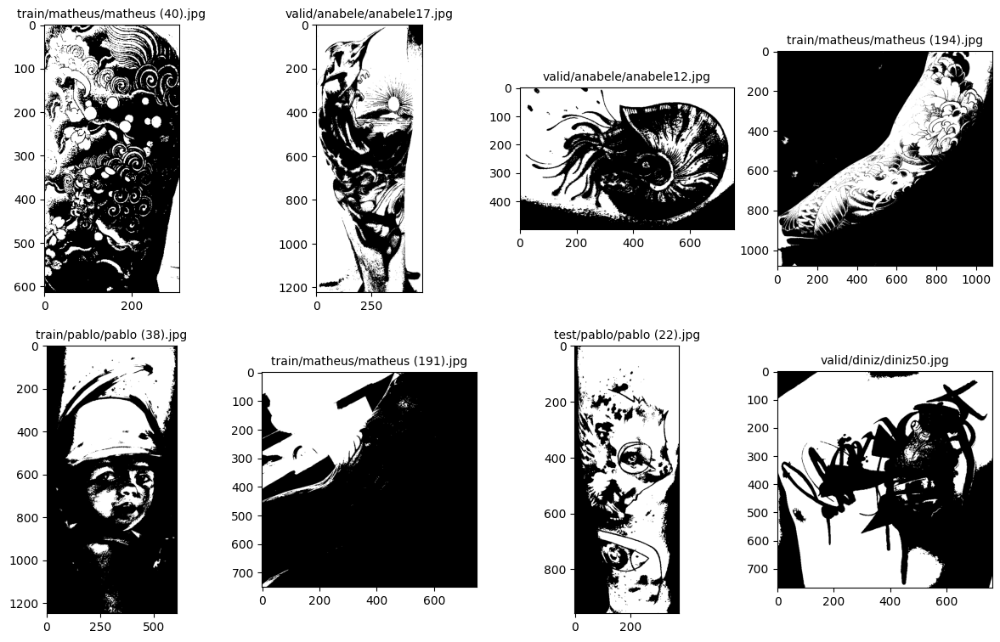

In [9]:
def apply_otsu_threshold(image_path):
  # Load the image in grayscale
  img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
  threshold_value, thresholded_img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  return thresholded_img

thresholded_images = [apply_otsu_threshold(i) for i in images]
plot_group_imgs(images, thresholded_images, linhas, colunas, (15, 9), cv2.COLOR_BGR2RGB)

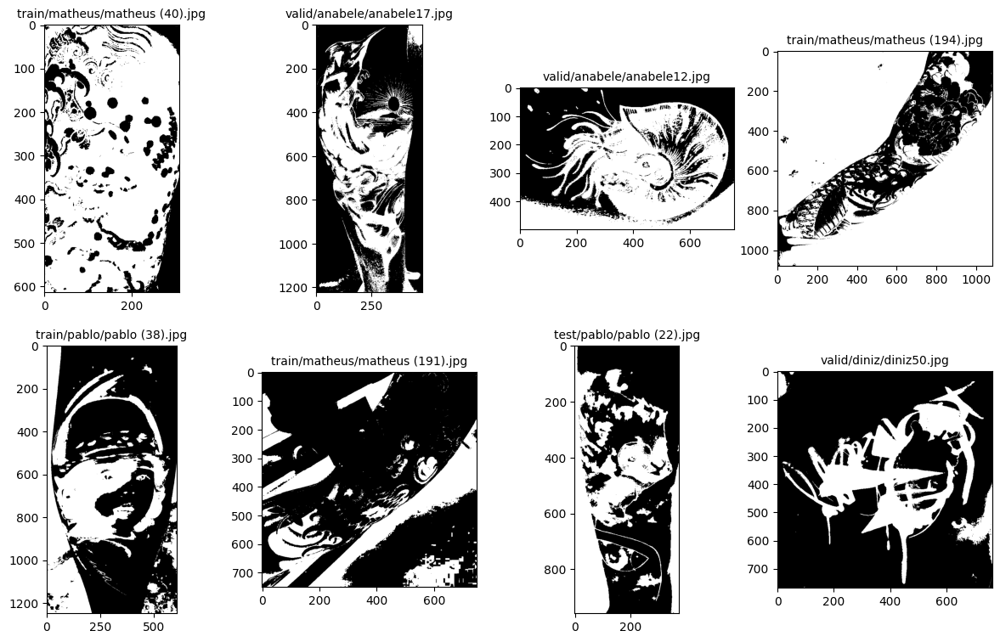

In [10]:
mod_otsu = []
for i in modified_images:
    gray = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
    threshold_value, thresholded_img = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    mod_otsu.append(thresholded_img)
plot_group_imgs(images, mod_otsu, linhas, colunas, (15, 9), cv2.COLOR_BGR2RGB)

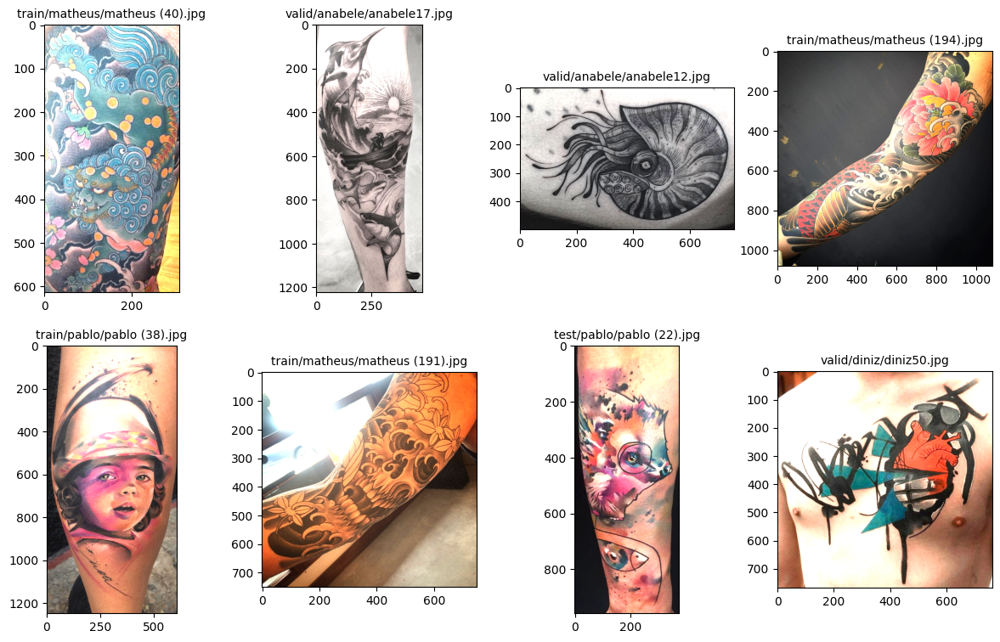

In [11]:
# imagem = cv2.imread(images[0])
alfa = 1.5
beta = 0.5
imagem_ajustada = [cv2.convertScaleAbs(cv2.imread(i), alpha=alfa, beta=beta) for i in images]
plot_group_imgs(images, imagem_ajustada, linhas, colunas, (15, 9), cv2.COLOR_BGR2RGB)

In [88]:
def diff_for_p(path, down=False):
    image = cv2.imread(path)
    
    alfa, beta = 1.5, 0.5
    image_contraste = cv2.convertScaleAbs(cv2.imread(path), alpha=alfa, beta=beta)
    
    image_no_skin = skin_to_white(cv2.imread(path))
    
    image_contraste_no_skin = skin_to_white(image_contraste)
    
    image_bordas = realcar_tatuagem(cv2.imread(path))
    
    image_contraste_bordas = realcar_tatuagem(image_contraste)
    
    fig, axes = plt.subplots(2, 3, figsize=(10, 9))
    
    color = cv2.COLOR_BGR2RGB
    # img = cv2.cvtColor(image_contraste_bordas, color)
    axes[0, 0].imshow(cv2.cvtColor(image, color))
    axes[0, 0].set_title("Normal", fontsize=10)
    axes[0, 0].axis('off')
    axes[1, 0].imshow(cv2.cvtColor(image_contraste, color))
    axes[1, 0].set_title("Com contraste", fontsize=10)
    axes[1, 0].axis('off')
    
    axes[0, 1].imshow(cv2.cvtColor(image_no_skin, color))
    axes[0, 1].set_title("Remove pele", fontsize=10)
    axes[0, 1].axis('off')
    axes[1, 1].imshow(cv2.cvtColor(image_contraste_no_skin, color))
    axes[1, 1].set_title("Com contraste + Remove pele", fontsize=10)
    axes[1, 1].axis('off')
    
    axes[0, 2].imshow(cv2.cvtColor(image_bordas, color))
    axes[0, 2].set_title("Bordas", fontsize=10)
    axes[0, 2].axis('off')
    axes[1, 2].imshow(cv2.cvtColor(image_contraste_bordas, color))
    axes[1, 2].set_title("Com contraste + Bordas", fontsize=10)
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    if down:
        plt.savefig(f"imgs/{path[path.rfind('/'):path.rfind('.')]}.png")
    plt.show()

In [89]:
# for index, row in df.iterrows():
#     p, g, c, f = row

#     alfa, beta = 1.5, 0.5
#     image_contraste = cv2.convertScaleAbs(cv2.imread(p), alpha=alfa, beta=beta)

#     # Create directories if they don't exist
#     os.makedirs(f'Dataset_Contraste/{g}/{c}', exist_ok=True)
#     cv2.imwrite(f'Dataset_Contraste/{g}/{c}/{f}', image_contraste)

#     image_no_skin = skin_to_white(cv2.imread(p))
#     os.makedirs(f'Dataset_Noskin/{g}/{c}', exist_ok=True)
#     cv2.imwrite(f'Dataset_Noskin/{g}/{c}/{f}', image_no_skin)

#     image_contraste_no_skin = skin_to_white(image_contraste)
#     os.makedirs(f'Dataset_Contraste_Noskin/{g}/{c}', exist_ok=True)
#     cv2.imwrite(f'Dataset_Contraste_Noskin/{g}/{c}/{f}', image_contraste_no_skin)

#     image_bordas = realcar_tatuagem(cv2.imread(p))
#     os.makedirs(f'Dataset_Bordas/{g}/{c}', exist_ok=True)
#     cv2.imwrite(f'Dataset_Bordas/{g}/{c}/{f}', image_bordas)

#     image_contraste_bordas = realcar_tatuagem(image_contraste)
#     os.makedirs(f'Dataset_Contraste_Bordas/{g}/{c}', exist_ok=True)
#     cv2.imwrite(f'Dataset_Contraste_Bordas/{g}/{c}/{f}', image_contraste_bordas)

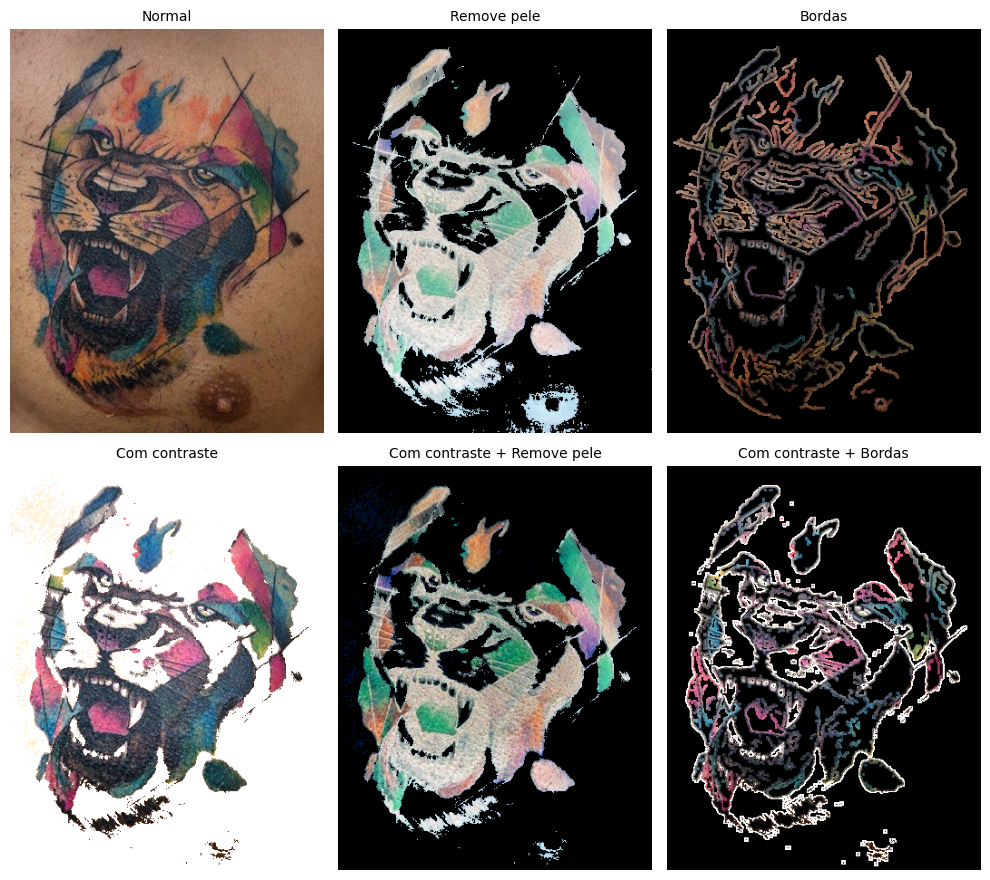

In [90]:
diff_for_p(df['paths'][234], down=True)

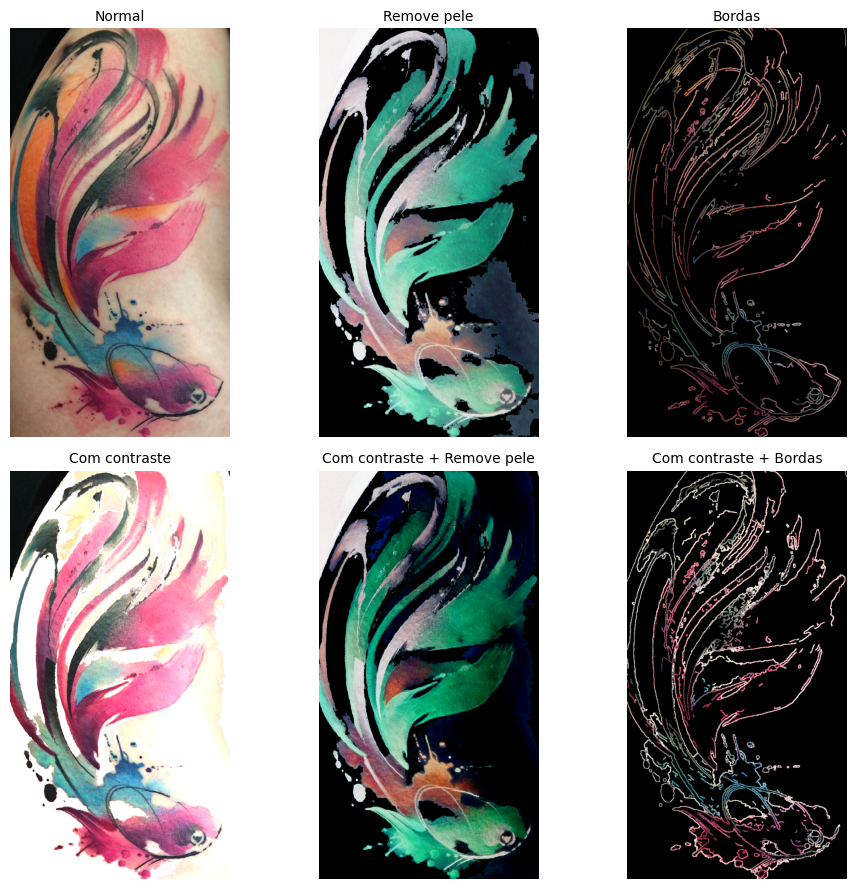

In [91]:
diff_for_p(df['paths'][230], down=True)

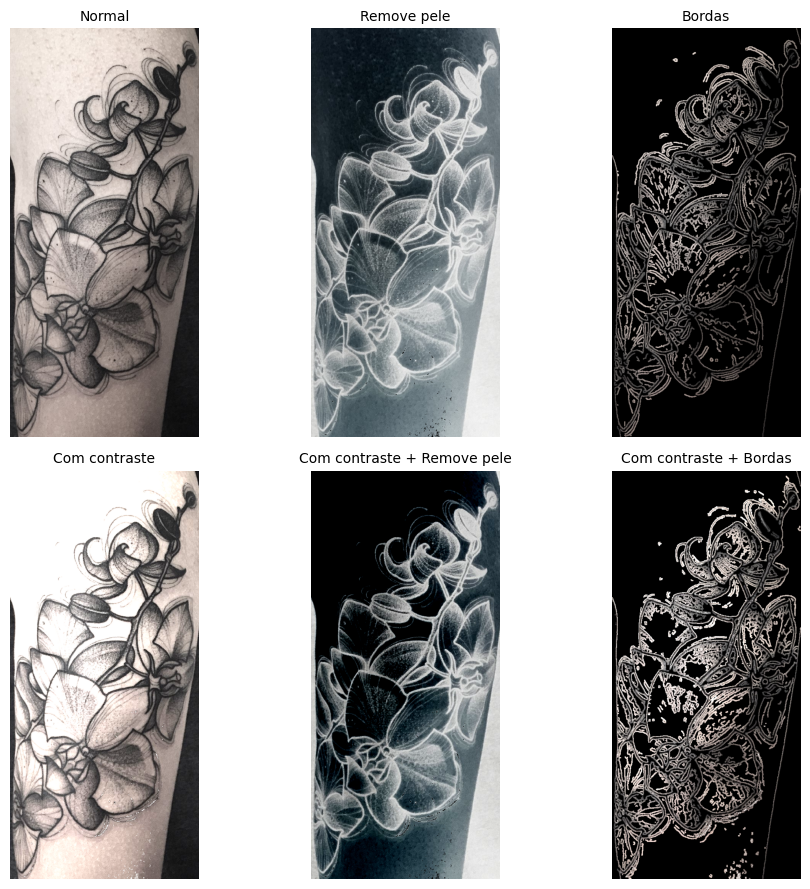

In [92]:
diff_for_p(df['paths'][679], down=True)

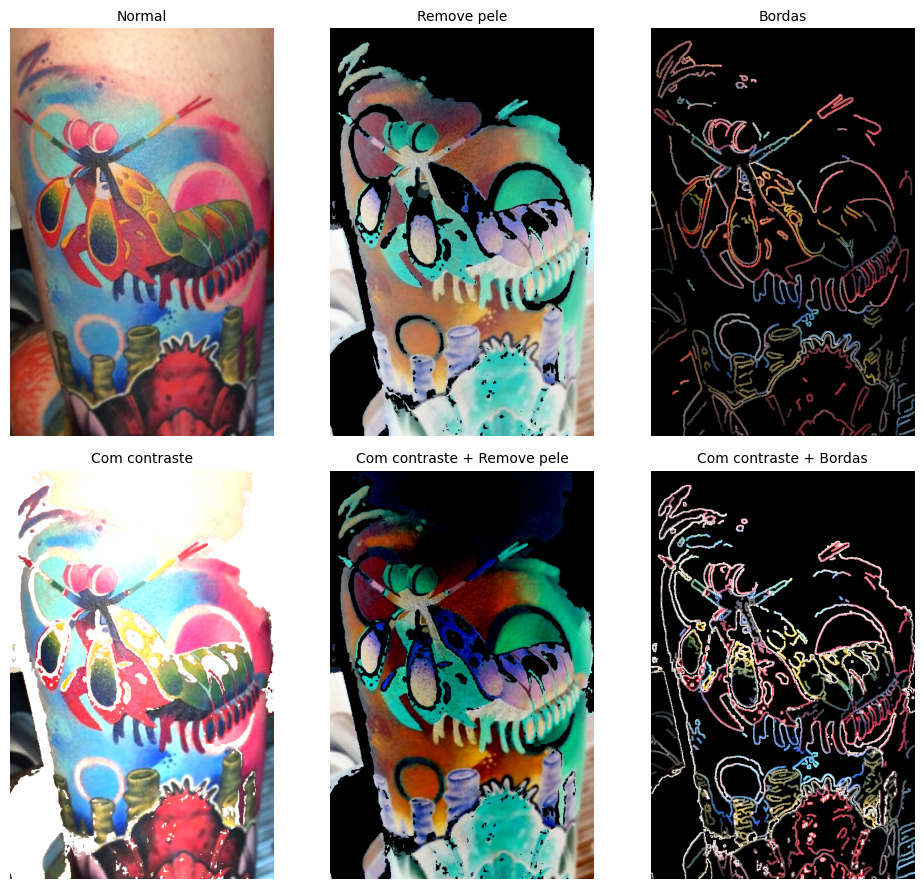

In [93]:
diff_for_p(df['paths'][313], down=True)

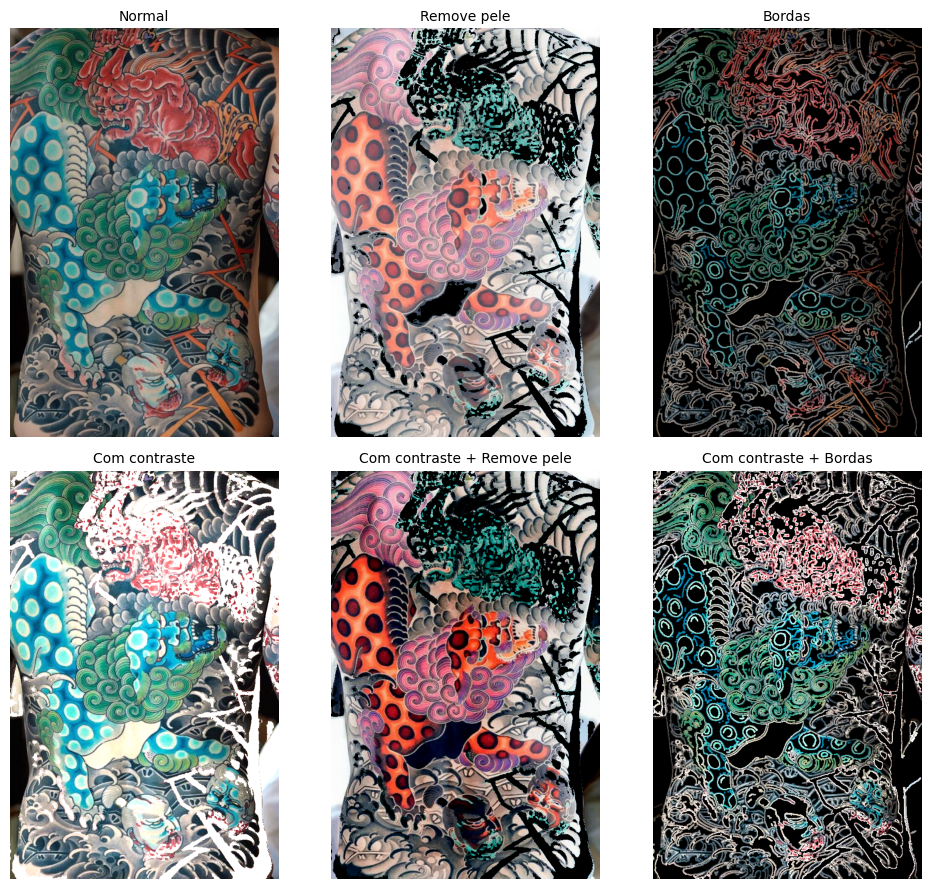

In [94]:
diff_for_p(df['paths'][913], down=True)